In [1]:
import jax
import jax.numpy as np
import matplotlib.pyplot as plt
import dLux.utils as dlu
import dLux as dl

# Basic jax import
jax.config.update("jax_enable_x64", True)

from jax.scipy.special import gammaln, xlogy

def poisson_loglike_gamma(k, mu):
    # analytic continuation using gammaln(k+1)
    k = np.asarray(k)
    mu = np.asarray(mu)
    valid = (k >= 0) & np.isfinite(k) & (mu > 0) & np.isfinite(mu)
    logp = xlogy(k, mu) - mu - gammaln(k + 1.0)
    return np.where(valid, logp, -np.inf)

def poisson_loglike_unnormalized(k, mu):
    # returns k*log(mu) - mu  (no normalization constant)
    return xlogy(k, mu) - mu

# define the likelihood function:
def poiss_loglike(pytree, data) -> float:
    """
    Poissonian log likelihood of the pytree given the data. Assumes the pytree
    has a .model() function.

    Parameters
    ----------
    pytree : Base
        Pytree with a .model() function.
    data : Array
        Data to compare the model to.

    Returns
    -------
    log_likelihood : Array
        Log likelihood of the pytree given the data.
    """
    return poisson_loglike_gamma(pytree.model(), data).sum()

plt.rcParams["image.origin"] = 'lower'

# import alpha cen
from dLuxToliman import AlphaCen, TolimanOpticalSystem
import zodiax as zdx

In [2]:
# I wonder if I can make it a dLux telescope?
# from F480M filter
wlweights = np.array([[4.58283333e-06, 4.64250000e-06, 4.70216667e-06, 4.76183333e-06,
        4.82150000e-06, 4.88116667e-06, 4.94083333e-06, 5.00050000e-06,
        5.06016667e-06],
       [4.83897537e-03, 4.27569626e-02, 1.79674591e-01, 1.84285712e-01,
        2.00072602e-01, 1.85606063e-01, 1.65577628e-01, 3.61394316e-02,
        1.04803396e-03]])

# just a bunch of wavelengths and filter weights
wavelengths = wlweights[0]
weights = wlweights[1]
# weights = np.ones_like(wavelengths)
# weights = np.array([1,0,0,0,0,0,0,0,0])

# let us instead make a polynomial spectrum
# of the form wavelengths, coefficients
# this will double the spectral weight over the bandpass
spec_C = 1 #-8.54
spec_grad = 0 #2083333
spectrum = dl.PolySpectrum(wavelengths, np.array([spec_C,spec_grad]))
# try extracting the AMI optics and putting it into a normal dlux system.. this is SO JANK
transmission = np.load("ami_transmission.npy")
aperture_layer = dl.TransmissiveLayer(transmission, True)

In [3]:
log_fluxes = np.linspace(7,10,4)

flux = 2.5*10**(8) #6.016
# binary source,
# going to have to import alpha cen because it has individial x and y position ? no
# source = AlphaCen(wavelengths=wavelengths, log_flux=np.log10(flux))
separation = 2 *4.80e-6/6.603464 # lambda/d separation

# 100:1 contrast ratio?
contrast = 100
source = dl.BinarySource(spectrum=spectrum, position=dlu.arcsec2rad(np.array([0,0])), 
                        mean_flux=flux, separation=separation, position_angle=0, contrast=contrast,
                        filter_wavelengths=wavelengths, filter_weights=weights)

## could just make a new point source
# source = dl.PointSource(wavelengths=wavelengths, position = dlu.arcsec2rad(np.array([0,0])), flux = flux)

# optional detector
detector_layers = [
    (
        'downsample',
        dl.detector_layers.Downsample(3)
    )
]
detector = dl.LayeredDetector(detector_layers)

layers = [
    (
        'aperture',
        aperture_layer
    )
]
optics = dl.AngularOpticalSystem(wf_npixels=1024, diameter=6.603464, psf_npixels=80, oversample=3, psf_pixel_scale=0.065524085, layers=layers)

# setting up the dithers

921839.515626876


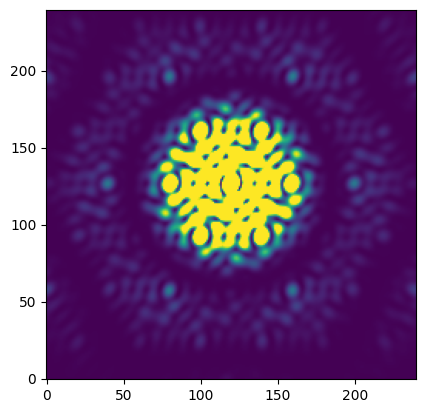

In [6]:
plt.imshow(np.minimum(optics.model(source),30000))
print(np.max(optics.model(source)))

In [521]:
THRESH = 30_000.0
angle = np.pi/2

def peak_at_radius(radial_arcsec, angle, optics, source, detector):
    # Build dithers for this radius (angle=0; tweak as needed)
    x = radial_arcsec * np.cos(angle)
    y = radial_arcsec * np.sin(angle)
    dithers = dlu.arcsec2rad(np.array([[x, -y]]))  # shape (1,2)
    model = dl.Dither(dithers, optics, source, detector)
    data = model.model()
    return np.max(data)

def bracket_threshold(angle, optics, source, detector, r_init=0.0, step=0.25, r_max=20.0):
    r = r_init
    p = float(peak_at_radius(r, angle, optics, source, detector))
    if p <= THRESH:
        return r_init, r_init  # already saturated at start
    while r < r_max:
        r_next = r + step
        p_next = float(peak_at_radius(r_next, angle, optics, source, detector))
        if p_next <= THRESH:
            return r, r_next  # bracket found
        r, step = r_next, step*1.5  # expand step geometrically
    return None, None  # never reaches threshold

def bisection_min_radius(angle, optics, source, detector, r_lo, r_hi, iters=30):
    # assumes peak(r_lo) < THRESH <= peak(r_hi)
    for _ in range(iters):
        r_mid = 0.5*(r_lo + r_hi)
        p_mid = float(peak_at_radius(r_mid, angle, optics, source, detector))
        if p_mid <= THRESH:
            r_hi = r_mid
        else:
            r_lo = r_mid
    return r_hi

r_lo, r_hi = bracket_threshold(angle, optics, source, detector, r_init=0.0, step=0.1, r_max=20.0)
if r_lo is None:
    print("Never hits 30k within 10 arcsec.")
else:
    r_star = bisection_min_radius(angle, optics, source, detector, r_lo, r_hi, iters=28)
    print("Smallest radius hitting leq 30k:", r_star, "arcsec")
# wow epic

Smallest radius hitting leq 30k: 5.838990679224663 arcsec


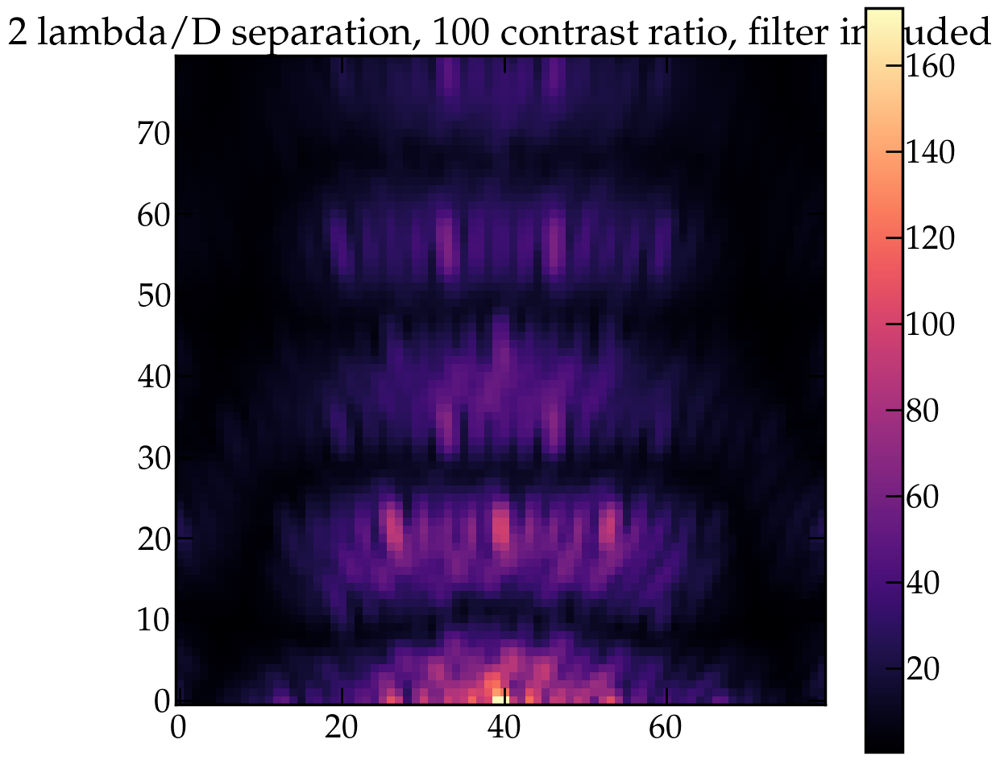

maximum photoelectron count:
29999.998747315083


In [522]:
# alright this is looking good!
radial_dist = r_star #arcsec

x_dither = radial_dist * np.cos(angle)
y_dither = radial_dist * np.sin(angle)
dithers = dlu.arcsec2rad(np.array([[x_dither,-y_dither]]))
model = dl.Dither(dithers, optics, source, detector)

data = model.model()

plt.imshow((data[0])**0.5, origin='lower', cmap='magma')
plt.colorbar()
plt.title('2 lambda/D separation, 100 contrast ratio, filter included')
plt.show()
print('maximum photoelectron count:')
print(np.max(data))

In [271]:
# parameters
marginal_params = ['separation', 'position_angle', 'mean_flux', 'contrast', 'coefficients', 'position']
# marginalise over mean wavelength ..??? ??
# unnecessary I think to marginalise over mean wavelength.. 
# shape_dict = {'coefficients': (1,)}

fisher_full = zdx.fisher_matrix(model, marginal_params, poiss_loglike, data=data)# , shape_dict=shape_dict)

In [272]:
keep_idx = np.array([0,1,2,3,5,6,7]) # skip the fourth index
fisher = fisher_full[np.ix_(keep_idx, keep_idx)]

# cov = np.linalg.inv(fisher)

In [300]:
F = fisher
# 1) Is it symmetric?
sym_diff = np.max(np.abs(F - F.T))
print("max abs(F - F.T) =", sym_diff)

# 2) Symmetrize (safe first step)
Fs = 0.5 * (F + F.T)

# w, V = np.linalg.eigh(Fs)
# tol = max(w.max(), 0) * 1e-100  # relative tolerance; adjust (1e-12..1e-8)
# w_clipped = np.clip(w, a_min=tol, a_max=None)
# cov = (V * (1.0 / w_clipped)) @ V.T

# print(np.linalg.eigh(Fs))
# print(np.linalg.eigh(cov))

# just gonna do inverse of symmetrised matrix
cov = np.linalg.inv(Fs)

max abs(F - F.T) = 1264.0


/Users/milolangker/anaconda3/envs/localToliman/lib/python3.12/site-packages/chainconsumer/chain.py:313: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  samples = rng.multivariate_normal(mean, covariance, size=1000000)  # type: ignore


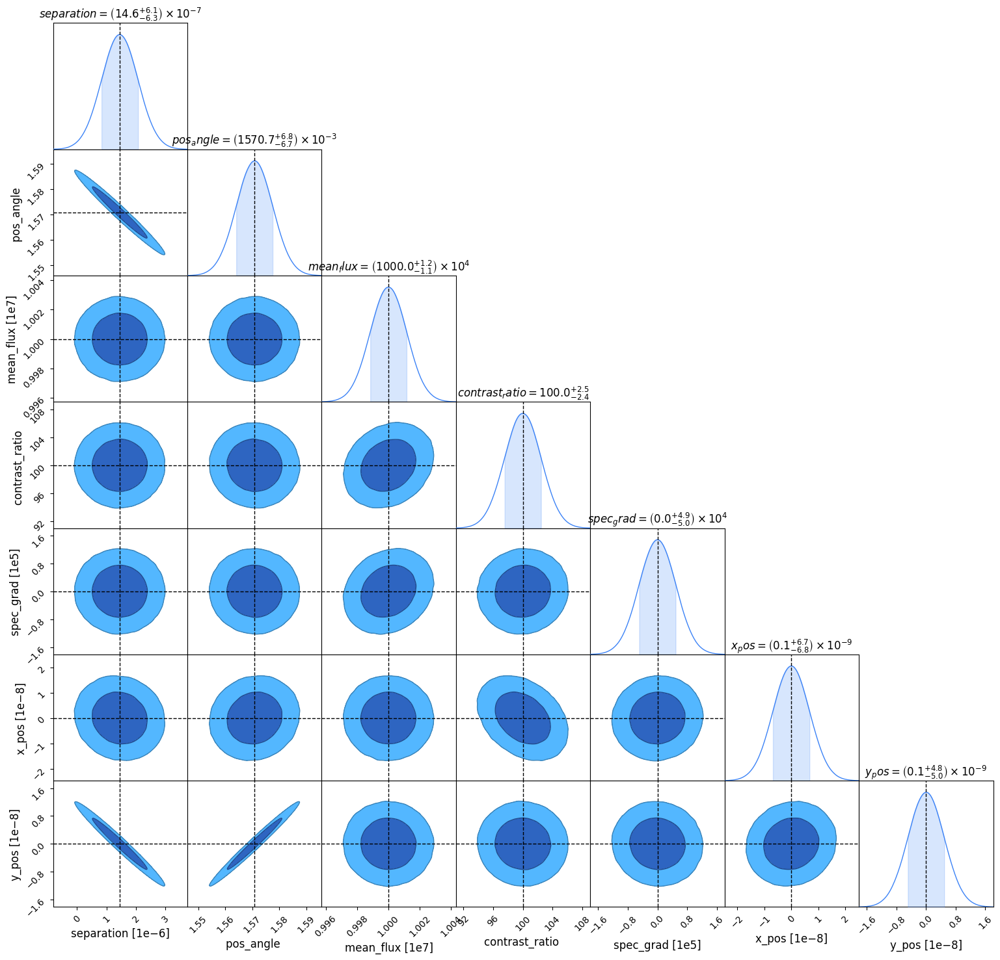

In [301]:
from chainconsumer import ChainConsumer, Chain, Truth
param_names = ['separation','pos_angle', 'mean_flux', 'contrast_ratio', 'spec_grad', 'x_pos', 'y_pos']
# X = np.zeros(len(param_names))
X = np.array([separation,np.pi/2, flux, contrast, spec_grad, 0, 0])

c = ChainConsumer()

c.add_chain(
    Chain.from_covariance(mean=X, covariance=cov, columns=param_names, name="cool")
)
c.add_truth(Truth(location={"separation": separation, "mean_flux": flux, "pos_angle": np.pi/2,
                            "contrast_ratio": contrast, "spec_grad": spec_grad, "x_pos": 0, "y_pos": 0}))

fig = c.plotter.plot()
# Curious

In [302]:
# its time to generate all the covariance matrices (fisher)

# some of them break.. separation is difficult to disentangle from pos_angle for example
# which totally breaks the fisher info
# we can remove those after.
# its because its like totally degenerate
THRESH = 30_000.0
angles = np.pi/24 * np.linspace(0,12,3)
log_fluxes = np.linspace(7,7,1)

# initilialise covariance matrices
fishers = []
# parameters
marginal_params = ['separation', 'position_angle', 'mean_flux', 'contrast', 'spectrum.coefficients', 'position']

# radial distances
radials = []
for log_flux in log_fluxes:
    print(log_flux)

    flux = 10**(log_flux)
    source = dl.BinarySource(spectrum=spectrum, position=dlu.arcsec2rad(np.array([0,0])), 
                        mean_flux=flux, separation=separation, position_angle=np.pi/2, contrast=contrast,
                        filter_wavelengths=wavelengths, filter_weights=weights)

    fishers_flux = []
    radials_flux = []

    for angle in angles:

        # just to check

        print(angle)
        r_lo, r_hi = bracket_threshold(angle, optics, source, detector, r_init=0.0, step=0.1, r_max=20.0)
        if r_lo is None:
            print("Never hits 30k within 20 arcsec.")
        else:
            r_star = bisection_min_radius(angle, optics, source, detector, r_lo, r_hi, iters=28)
            print("Smallest radius hitting leq 30k:", r_star, "arcsec")
        
        # saving that radius
        radials_flux.append(r_star)

        radial_dist = r_star #arcsec

        x_dither = radial_dist * np.cos(angle)
        y_dither = radial_dist * np.sin(angle)
        dithers = dlu.arcsec2rad(np.array([[x_dither,-y_dither]]))
        model = dl.Dither(dithers, optics, source, detector)

        data = model.model()
        fisher_full = zdx.fisher_matrix(model, marginal_params, poiss_loglike, data=data)
        #fisher = fisher_full[np.ix_(keep_idx, keep_idx)]
        # will keep the full fishers
        # can change with the indices when inverting
        fishers_flux.append(fisher_full)

    # appending
    fishers.append(fishers_flux)
    radials.append(radials_flux)

7.0
0.0
Smallest radius hitting leq 30k: 3.36864387075475 arcsec
0.7853981633974483
Smallest radius hitting leq 30k: 4.215050987704307 arcsec
1.5707963267948966
Smallest radius hitting leq 30k: 3.410131608485245 arcsec


In [303]:
fishers_array = np.array(fishers)

In [ ]:
keep_idx = np.array([0,1,2,3,5,6,7]) # skip the fourth index
# scale array OMG you should've done this SO MUCH EARLIER. AHHAGHDJKAHGKDJSGH
# strange, have to do arcsec2rad instead of rad2arcsec
S = np.diag(np.array([dlu.arcsec2rad(1e-3), np.pi/180, 1, 1, 1, dlu.arcsec2rad(1e-3), dlu.arcsec2rad(1e-3)]))

fishers_1 = S @ (0.5 * (fishers_array[0][0] + fishers_array[0][0].T)[np.ix_(keep_idx, keep_idx)]) @ S
fishers_2 = S @ (0.5 * (fishers_array[0][1] + fishers_array[0][1].T)[np.ix_(keep_idx, keep_idx)]) @ S
fishers_3 = S @ (0.5 * (fishers_array[0][2] + fishers_array[0][2].T)[np.ix_(keep_idx, keep_idx)]) @ S

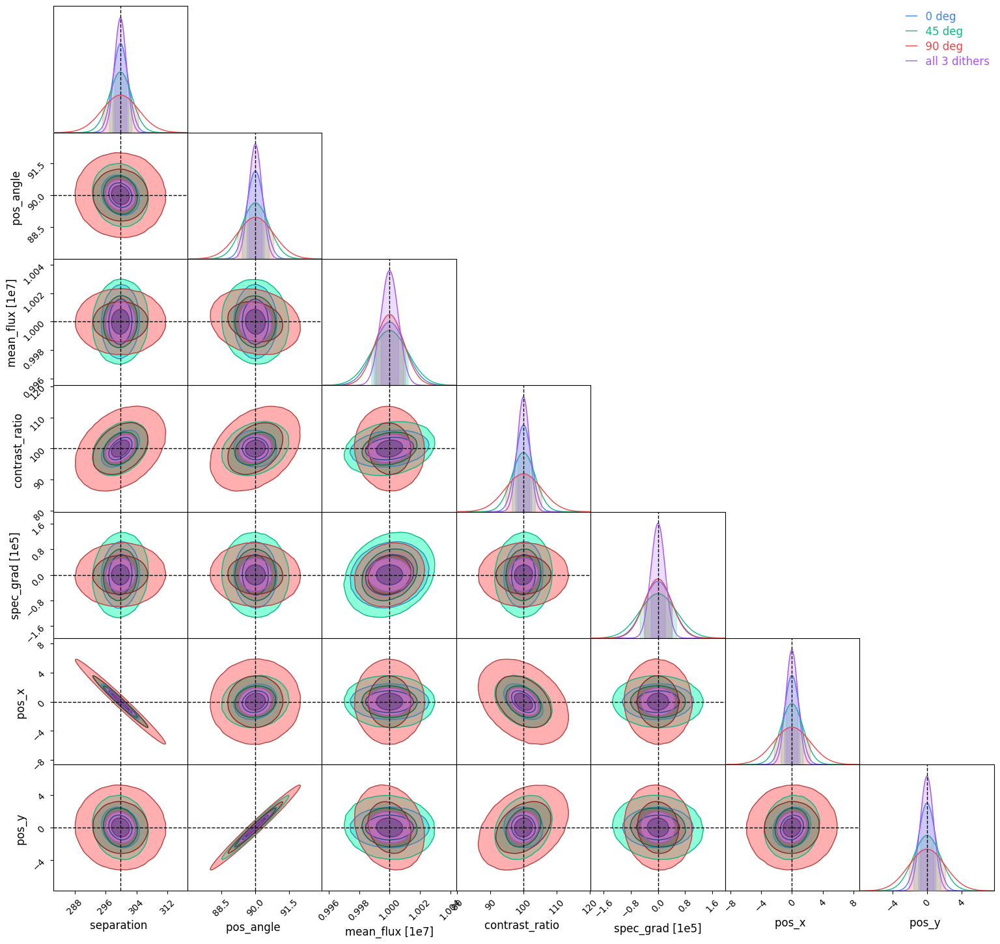

In [347]:
# normal
param_names = ['separation', 'pos_angle', 'mean_flux', 'contrast_ratio','spec_grad', 'pos_x', 'pos_y']
X = np.array([1000*dlu.rad2arcsec(separation), 90, flux, contrast, spec_grad, 0, 0])

# no posangle
# param_names = ['separation', 'mean_flux', 'contrast_ratio','spec_grad', 'pos_x', 'pos_y']
# X = np.array([separation, flux, contrast, spec_grad, 0, 0])

c = ChainConsumer()

c.add_chain(
    Chain.from_covariance(mean=X, covariance=np.linalg.inv(fishers_1), columns=param_names, name="0 deg")
)

c.add_chain(
    Chain.from_covariance(mean=X, covariance=np.linalg.inv(fishers_2), columns=param_names, name="45 deg")
)

c.add_chain(
    Chain.from_covariance(mean=X, covariance=np.linalg.inv(fishers_3), columns=param_names, name="90 deg")
)

c.add_chain(
    Chain.from_covariance(mean=X, covariance=np.linalg.inv(fishers_1+fishers_2+fishers_3), columns=param_names, name="all 3 dithers")
)

c.add_truth(Truth(location={"separation": 1000*dlu.rad2arcsec(separation), "pos_angle": 90, "mean_flux": flux, 
                            "contrast_ratio": contrast, "spec_grad": spec_grad, "pos_x": 0, "pos_y": 0}))

fig = c.plotter.plot()

# My GOD
# lesson learned: check your condition number brother...
# parameterise well you sILLY BILLY

In [348]:
# ok lets do it for real with all the different orders of magnitude:
THRESH = 30_000.0
angles = np.pi/24 * np.linspace(0,12,13)
log_fluxes = np.linspace(7,10,4)

# initilialise covariance matrices
fishers = []
# parameters
marginal_params = ['separation', 'position_angle', 'mean_flux', 'contrast', 'spectrum.coefficients', 'position']

# radial distances
radials = []
for log_flux in log_fluxes:
    print(log_flux)

    flux = 10**(log_flux)
    source = dl.BinarySource(spectrum=spectrum, position=dlu.arcsec2rad(np.array([0,0])), 
                        mean_flux=flux, separation=separation, position_angle=np.pi/2, contrast=contrast,
                        filter_wavelengths=wavelengths, filter_weights=weights)

    fishers_flux = []
    radials_flux = []

    for angle in angles:

        # just to check

        print(angle)
        r_lo, r_hi = bracket_threshold(angle, optics, source, detector, r_init=0.0, step=0.1, r_max=20.0)
        if r_lo is None:
            print("Never hits 30k within 20 arcsec.")
        else:
            r_star = bisection_min_radius(angle, optics, source, detector, r_lo, r_hi, iters=28)
            print("Smallest radius hitting leq 30k:", r_star, "arcsec")
        
        # saving that radius
        radials_flux.append(r_star)

        radial_dist = r_star #arcsec

        x_dither = radial_dist * np.cos(angle)
        y_dither = radial_dist * np.sin(angle)
        dithers = dlu.arcsec2rad(np.array([[x_dither,-y_dither]]))
        model = dl.Dither(dithers, optics, source, detector)

        data = model.model()
        fisher_full = zdx.fisher_matrix(model, marginal_params, poiss_loglike, data=data)

        # scale the variables
        S = np.diag(np.array([dlu.arcsec2rad(1e-3), np.pi/180, 1, 1, 1, 1, dlu.arcsec2rad(1e-3), dlu.arcsec2rad(1e-3)]))

        fisher_scale = S @ fisher_full @ S

        # enforce symmetry
        fisher_sym = 0.5 * (fisher_scale + fisher_scale.T)

        fishers_flux.append(fisher_sym)

    # appending
    fishers.append(fishers_flux)
    radials.append(radials_flux)

7.0
0.0
Smallest radius hitting leq 30k: 3.36864387075475 arcsec
0.1308996938995747
Smallest radius hitting leq 30k: 3.3974489932559666 arcsec
0.2617993877991494
Smallest radius hitting leq 30k: 3.4870877661596755 arcsec
0.39269908169872414
Smallest radius hitting leq 30k: 3.6498464492993663 arcsec
0.5235987755982988
Smallest radius hitting leq 30k: 3.8909684278303756 arcsec
0.6544984694978735
Smallest radius hitting leq 30k: 4.250030791465543 arcsec
0.7853981633974483
Smallest radius hitting leq 30k: 4.215050987704307 arcsec
0.916297857297023
Smallest radius hitting leq 30k: 4.299779850937193 arcsec
1.0471975511965976
Smallest radius hitting leq 30k: 3.9365746883617243 arcsec
1.1780972450961724
Smallest radius hitting leq 30k: 3.6952010374254316 arcsec
1.308996938995747
Smallest radius hitting leq 30k: 3.531544207141269 arcsec
1.4398966328953218
Smallest radius hitting leq 30k: 3.442187556839782 arcsec
1.5707963267948966
Smallest radius hitting leq 30k: 3.410131608485245 arcsec
8.0
0.

In [ ]:
fishers_array = np.array(fishers)
radials_array = np.array(radials)

# np.save("fishers_array_2", fishers_array)
# np.save("radials_array_2", radials_array)

/Users/milolangker/anaconda3/envs/localToliman/lib/python3.12/site-packages/chainconsumer/chain.py:313: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  samples = rng.multivariate_normal(mean, covariance, size=1000000)  # type: ignore
/Users/milolangker/anaconda3/envs/localToliman/lib/python3.12/site-packages/chainconsumer/chain.py:313: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  samples = rng.multivariate_normal(mean, covariance, size=1000000)  # type: ignore
/Users/milolangker/anaconda3/envs/localToliman/lib/python3.12/site-packages/chainconsumer/chain.py:313: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  samples = rng.multivariate_normal(mean, covariance, size=1000000)  # type: ignore
/Users/milolangker/anaconda3/envs/localToliman/lib/python3.12/site-packages/chainconsumer/chain.py:313: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  samples = rng.multivariate_normal(mean, covariance, size=10000

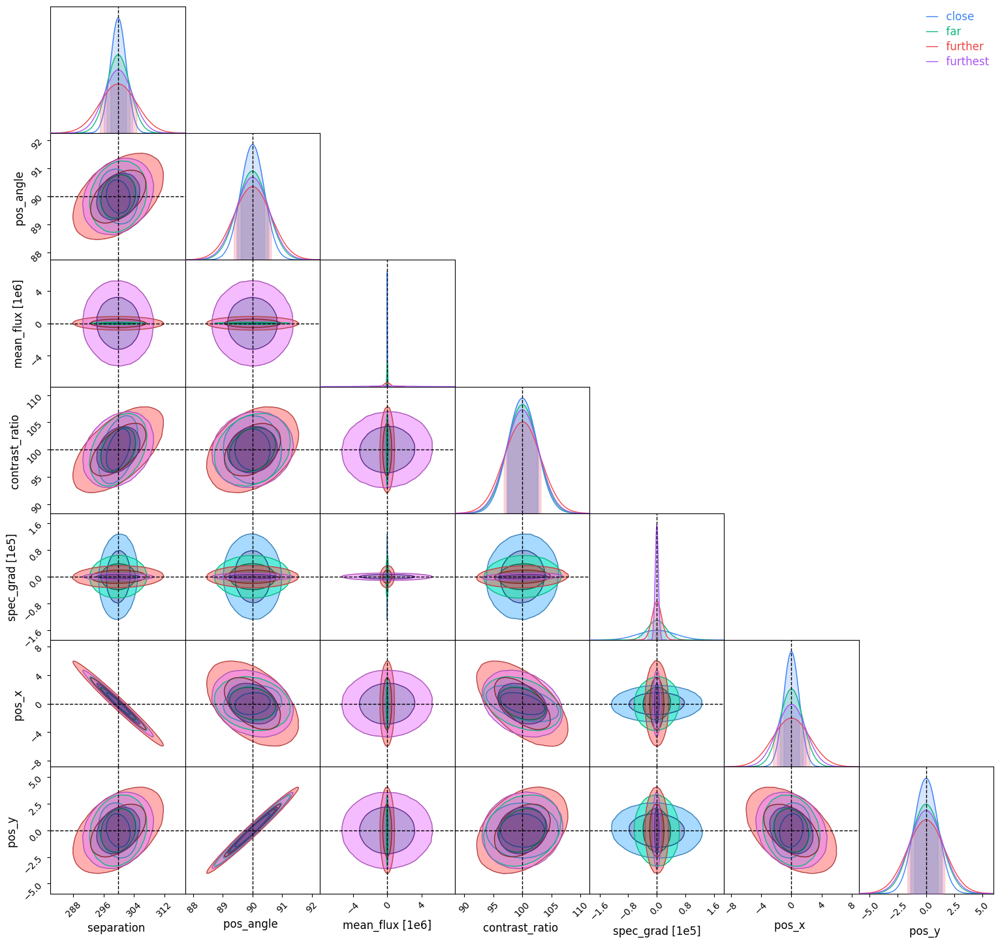

In [358]:
# normal
idx = 0

keep_idx = np.array([0,1,2,3,5,6,7])
f1 = fishers_array[idx][4][np.ix_(keep_idx, keep_idx)]
f2 = fishers_array[idx+1][4][np.ix_(keep_idx, keep_idx)]
f3 = fishers_array[idx+2][4][np.ix_(keep_idx, keep_idx)]
f4 = fishers_array[idx+3][4][np.ix_(keep_idx, keep_idx)]

param_names = ['separation', 'pos_angle', 'mean_flux', 'contrast_ratio','spec_grad', 'pos_x', 'pos_y']
X = np.array([1000*dlu.rad2arcsec(separation), 90, 0, contrast, spec_grad, 0, 0])

# no posangle
# param_names = ['separation', 'mean_flux', 'contrast_ratio','spec_grad', 'pos_x', 'pos_y']
# X = np.array([separation, flux, contrast, spec_grad, 0, 0])

# no flux
# param_names = ['separation','pos_angle', 'contrast_ratio','spec_grad', 'pos_x', 'pos_y']
# X = np.array([1000*dlu.rad2arcsec(separation), 90, contrast, spec_grad, 0, 0])

c = ChainConsumer()

c.add_chain(
    Chain.from_covariance(mean=X, covariance=np.linalg.inv(f1), columns=param_names, name="close")
)

c.add_chain(
    Chain.from_covariance(mean=X, covariance=np.linalg.inv(f2), columns=param_names, name="far")
)

c.add_chain(
    Chain.from_covariance(mean=X, covariance=np.linalg.inv(f3), columns=param_names, name="further")
)

c.add_chain(
    Chain.from_covariance(mean=X, covariance=np.linalg.inv(f4), columns=param_names, name="furthest")
)

c.add_truth(Truth(location={"separation": 1000*dlu.rad2arcsec(separation), "pos_angle": 90, "mean_flux": 0, 
                            "contrast_ratio": contrast, "spec_grad": spec_grad, "pos_x": 0, "pos_y": 0}))

fig = c.plotter.plot()

In [15]:
#fishers_per_pixel = []
#flux_per_pixel = []

optics_pixel = dl.AngularOpticalSystem(wf_npixels=1024, diameter=6.603464, psf_npixels=1, oversample=3, psf_pixel_scale=0.065524085, layers=layers)

total_npix = 160

dithers_pixel = dlu.arcsec2rad(dlu.pixel_coords(total_npix, total_npix*0.065524085)) # pixel scale. will give dithers in rad

source = dl.BinarySource(spectrum=spectrum, position=dlu.arcsec2rad(np.array([-2,2])), 
                        mean_flux=1e10, separation=separation, position_angle=np.pi/2, contrast=contrast,
                        filter_wavelengths=wavelengths, filter_weights=weights)

In [16]:
# need a matrix fishers
marginal_params = ['separation', 'spectrum.coefficients']

total_params = len(marginal_params) + 1 #because spectrum coefficeints and position 

fishers_pixel = np.zeros((total_npix, total_npix, total_params, total_params))

fluxes_pixel = np.zeros((total_npix, total_npix))

for i in range(total_npix):
    for j in range(total_npix):
        dither_pixel = np.array([dithers_pixel[:, i, j]])

        # initialising the model
        model_pixel = dl.Dither(dither_pixel, optics_pixel, source, detector)

        data_pixel = model_pixel.model()
        fisher_full = zdx.fisher_matrix(model_pixel, marginal_params, poiss_loglike, data=data_pixel)

        # scale the variables
        S = np.diag(np.array([dlu.arcsec2rad(1e-3), 1, 1]))

        fisher_scale = S @ fisher_full @ S

        # enforce symmetry
        fisher_sym = 0.5 * (fisher_scale + fisher_scale.T)
        print(i,j)
        fishers_pixel = fishers_pixel.at[i, j].set(fisher_sym)

        flux_pixel = np.sum(data_pixel)
        fluxes_pixel = fluxes_pixel.at[i, j].set(flux_pixel)

# delightfully devilish..

0 0
0 1
0 2
0 3
0 4
0 5
0 6
0 7
0 8
0 9
0 10
0 11
0 12
0 13
0 14
0 15
0 16
0 17
0 18
0 19
0 20
0 21
0 22
0 23
0 24
0 25
0 26
0 27
0 28
0 29
0 30
0 31
0 32
0 33
0 34
0 35
0 36
0 37
0 38
0 39
0 40
0 41
0 42
0 43
0 44
0 45
0 46
0 47
0 48
0 49
0 50
0 51
0 52
0 53
0 54
0 55
0 56
0 57
0 58
0 59
0 60
0 61
0 62
0 63
0 64
0 65
0 66
0 67
0 68
0 69
0 70
0 71
0 72
0 73
0 74
0 75
0 76
0 77
0 78
0 79
0 80
0 81
0 82
0 83
0 84
0 85
0 86
0 87
0 88
0 89
0 90
0 91
0 92
0 93
0 94
0 95
0 96
0 97
0 98
0 99
0 100
0 101
0 102
0 103
0 104
0 105
0 106
0 107
0 108
0 109
0 110
0 111
0 112
0 113
0 114
0 115
0 116
0 117
0 118
0 119
0 120
0 121
0 122
0 123
0 124
0 125
0 126
0 127
0 128
0 129
0 130
0 131
0 132
0 133
0 134
0 135
0 136
0 137
0 138
0 139
0 140
0 141
0 142
0 143
0 144
0 145
0 146
0 147
0 148
0 149
0 150
0 151
0 152
0 153
0 154
0 155
0 156
0 157
0 158
0 159
1 0
1 1
1 2
1 3
1 4


KeyboardInterrupt: 

In [491]:
# wait i can just do finite differences im stupid rofl
psf_npix = 360

optics_large = dl.AngularOpticalSystem(wf_npixels=1024, diameter=6.603464, psf_npixels=psf_npix, oversample=3, psf_pixel_scale=0.065524085, layers=layers)

source = dl.BinarySource(spectrum=spectrum, position=dlu.arcsec2rad(np.array([0,0])), 
                        mean_flux=1e10, separation=separation, position_angle=0, contrast=contrast,
                        filter_wavelengths=wavelengths, filter_weights=weights)

model_large = dl.Telescope(optics_large, source, detector)

psf_original = model_large.model()

dsep = 1.01

source_dsep = dl.BinarySource(spectrum=spectrum, position=dlu.arcsec2rad(np.array([0,0])), 
                        mean_flux=1e10, separation=separation*dsep, position_angle=0, contrast=contrast,
                        filter_wavelengths=wavelengths, filter_weights=weights)

model_dsep = dl.Telescope(optics_large, source_dsep, detector)

psf_dsep = model_dsep.model()

fisher_sep = ((psf_dsep-psf_original)/(separation*(dsep-1)))**2/psf_original

dgrad = 1
dspectrum = dl.PolySpectrum(wavelengths, np.array([1,dgrad]))

source_dspec = dl.BinarySource(spectrum=dspectrum, position=dlu.arcsec2rad(np.array([0,0])), 
                        mean_flux=1e10, separation=separation, position_angle=0, contrast=contrast,
                        filter_wavelengths=wavelengths, filter_weights=weights)

model_dspec = dl.Telescope(optics_large, source_dspec, detector)

psf_dspec = model_dspec.model()

fisher_spec = ((psf_dspec - psf_original)/(dgrad))**2/psf_original

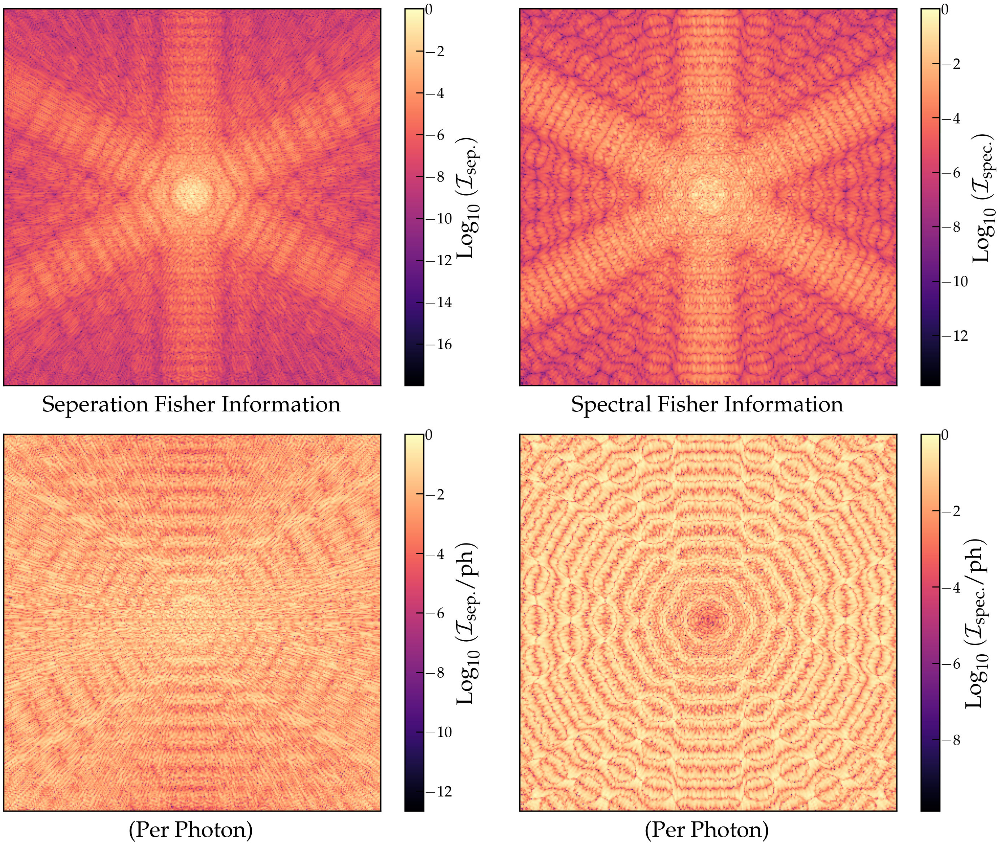

In [492]:
fig = plt.figure(figsize=(29,24))
# plt.subplot(2,3,1)
# plt.title('Log Binary Image')
# plt.imshow(np.log10(psf_original/2e10), cmap='magma')
# plt.colorbar()

ax1 = fig.add_subplot(2,2,1)
#plt.title('Log Separation F.I.')

im1 = ax1.imshow(np.log10(fisher_sep/np.max(fisher_sep)), cmap='magma', origin='lower')
cbar1 = fig.colorbar(im1, ax=ax1)
cbar1.set_label(r'$\mathrm{Log}_{10} \ (\mathcal{I}_{\mathrm{sep.}})$')
ax1.set_xticks([])
ax1.set_yticks([])
ax1.set_xlabel('Seperation Fisher Information',labelpad=20)
ax2 = fig.add_subplot(2,2,2)
#plt.title('Log Spectral Grad. F.I.')

im2 = ax2.imshow(np.log10(fisher_spec/np.max(fisher_spec)), cmap='magma', origin='lower')
cbar2 = fig.colorbar(im2, ax=ax2)
cbar2.set_label(r'$\mathrm{Log}_{10} \ (\mathcal{I}_{\mathrm{spec.}})$')
ax2.set_xticks([])
ax2.set_yticks([])
ax2.set_xlabel('Spectral Fisher Information',labelpad=20)

ax3 = fig.add_subplot(2,2,3)
#plt.title('Log Separation F.I. per photon')
im3 = ax3.imshow(np.log10((fisher_sep/psf_original)/np.max(fisher_sep/psf_original)), cmap='magma', origin='lower')
cbar3 = fig.colorbar(im3, ax=ax3)
cbar3.set_label(r'$\mathrm{Log}_{10} \ (\mathcal{I}_{\mathrm{sep.}}/\mathrm{ph})$')
ax3.set_xticks([])
ax3.set_yticks([])
ax3.set_xlabel('(Per Photon)',labelpad=20)

ax4 = fig.add_subplot(2,2,4)
#plt.title('Log Spectral Grad. F.I. per photon')
im4 = ax4.imshow(np.log10((fisher_spec/psf_original)/np.max(fisher_spec/psf_original)), cmap='magma', origin='lower')
cbar4 = fig.colorbar(im4, ax=ax4)
cbar4.set_label(r'$\mathrm{Log}_{10} \ (\mathcal{I}_{\mathrm{spec.}}/\mathrm{ph})$')
ax4.set_xticks([])
ax4.set_yticks([])
ax4.set_xlabel('(Per Photon)',labelpad=20)

plt.tight_layout()

#plt.savefig('pixel_fisher_large_vertical.pdf',dpi=300,bbox_inches='tight')
plt.show()

In [493]:
# make a poissonian for funsies
import jax.random as jr
psf_poisson = jr.poisson(jr.PRNGKey(0), psf_original/5e4)
from matplotlib.patches import Rectangle
from matplotlib.patches import Circle

import matplotlib.patheffects as pe
text_path_effects=[pe.Stroke(linewidth=2, foreground='white'), pe.Normal()]
text_path_effects_b=[pe.Stroke(linewidth=2, foreground='k'), pe.Normal()]
path_effects = [pe.Stroke(linewidth=12, foreground='white'), pe.Normal()]
# path_effects_big = [pe.Stroke(linewidth=10, foreground='k'), pe.Normal()]
s_text_path_effects=[pe.Stroke(linewidth=1, foreground='white'), pe.Normal()]
s_path_effects = [pe.Stroke(linewidth=10, foreground='white'), pe.Normal()]
plt.style.use('../../wk17/sty.mplstyle')

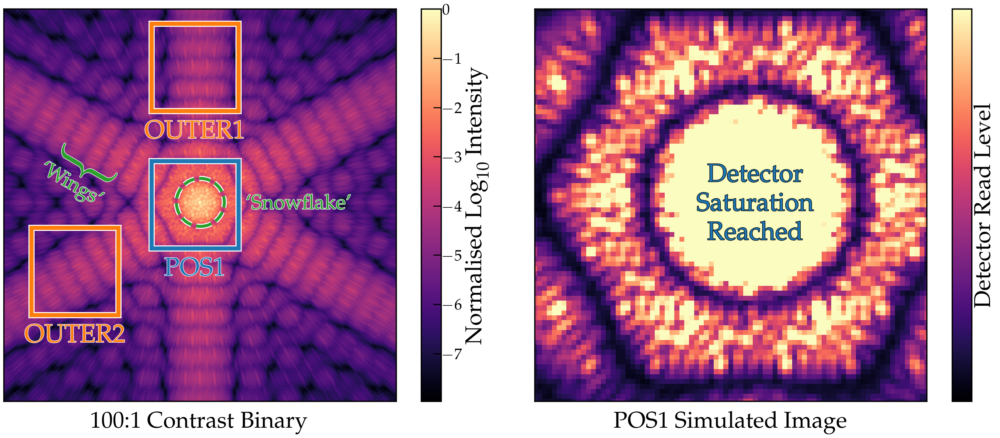

In [ ]:
plt.style.use('../../wk17/sty.mplstyle')
psf_saturated = np.minimum(psf_original,0.0035*np.max(psf_original))


fig = plt.figure(figsize=(29,12))
ax = fig.add_subplot(1,2,1)
im = ax.imshow(np.log10(psf_original/np.max(psf_original)), cmap='magma', origin='lower')
cbar = fig.colorbar(im, ax=ax)
cbar.set_label(r'Normalised $\mathrm{Log}_{10}$ Intensity')
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlabel('100:1 Contrast Binary', labelpad=20)

# centre at x_zero,y_zero and rectangle size in data units
x_zero = psf_npix/2-5
y_zero = psf_npix/2
width = 80
height = 80
lower_left = (x_zero - width/2, y_zero - height/2)

rect = Rectangle(lower_left, width, height,
                 edgecolor='tab:blue', facecolor='none',
                 linewidth=8, linestyle='-', path_effects=path_effects)
ax.add_patch(rect)

ax.text(
    psf_npix/2-5, psf_npix/2-60,
    r"POS1",
    va='center', ha='center',
    path_effects=text_path_effects, color='tab:blue', fontsize=50
)

circ = Circle((psf_npix/2, psf_npix/2+2), 22,
              edgecolor='tab:green', facecolor='none', linewidth=6, alpha=1, path_effects = s_path_effects, ls='--')
ax.add_patch(circ)

# snowflake
ax.text(
    psf_npix/2+90, psf_npix/2,
    r"`Snowflake'",
    va='center', ha='center',
    path_effects = text_path_effects, color='tab:green', fontsize=40
)

# wings text
ax.text(
    psf_npix*0.17, psf_npix*0.55,
    r"`Wings'",
    va='center', ha='center',
    path_effects = text_path_effects, color='tab:green', fontsize=40, rotation=-30
)
# wings bracket
ax.text(
    psf_npix*0.17+15, psf_npix*0.55+15,
    r"\{",
    va='center', ha='center',
    path_effects = text_path_effects, color='tab:green', fontsize=120, rotation=-30+90
)



# outer dithers
# centre at x_zero,y_zero and rectangle size in data units
x_zero = psf_npix/2-5
y_zero = 0.85*psf_npix
width = 80
height = 80
lower_left = (x_zero - width/2, y_zero - height/2)

rect = Rectangle(lower_left, width, height,
                 edgecolor='tab:orange', facecolor='none',
                 linewidth=8, linestyle='-', path_effects=path_effects)
ax.add_patch(rect)


ax.text(
    psf_npix/2-5, 0.85*psf_npix-60,
    r"OUTER1",
    va='center', ha='center',
    path_effects=text_path_effects, color='tab:orange', fontsize=50
)

# now add outer 2
x_zero = 0.18*psf_npix
y_zero = 0.33*psf_npix
width = 80
height = 80
lower_left = (x_zero - width/2, y_zero - height/2)

rect = Rectangle(lower_left, width, height,
                 edgecolor='tab:orange', facecolor='none',
                 linewidth=8, linestyle='-', path_effects=path_effects)
ax.add_patch(rect)


ax.text(
    x_zero, y_zero-60,
    r"OUTER2",
    va='center', ha='center',
    path_effects=text_path_effects, color='tab:orange', fontsize=50
)

ax2 = fig.add_subplot(1,2,2)
im2 = ax2.imshow((psf_saturated/np.max(psf_saturated))**0.5, cmap='magma', origin='lower')
cbar2 = fig.colorbar(im2, ax=ax2)
cbar2.set_label('Detector Read Level')
cbar2.set_ticks([])
ax2.set_xticks([])
ax2.set_yticks([])
ax2.set_xlim(psf_npix/2-5-40,psf_npix/2+40-5)
ax2.set_ylim(psf_npix/2-40,psf_npix/2+40)
ax2.set_xlabel('POS1 Simulated Image', labelpad=20)

ax2.text(
    psf_npix/2, psf_npix/2,
    "Detector\nSaturation\nReached",
    va='center', ha='center',
    path_effects=text_path_effects_b, color='tab:blue', fontsize=50
)

plt.tight_layout()

#plt.savefig('outer12EVENbetter.pdf', dpi=300, bbox_inches='tight')
plt.show()

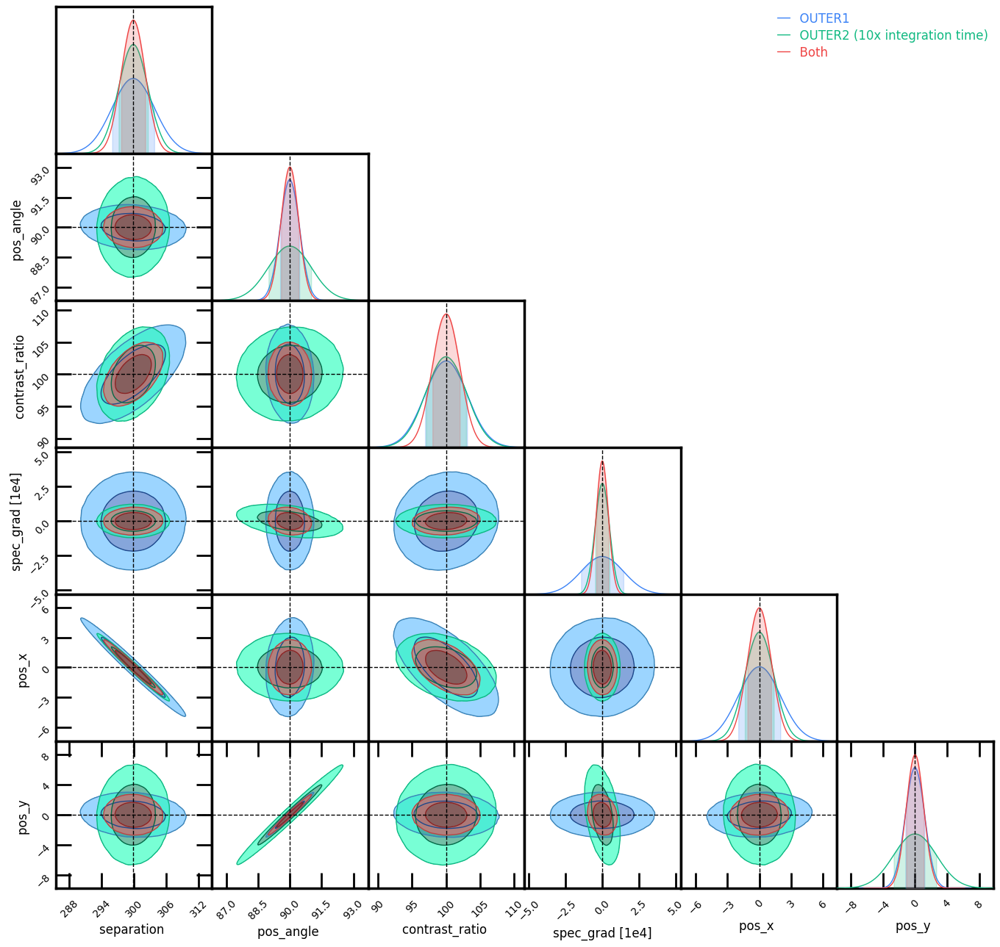

In [461]:
# have to make the last figure; the fisher information at pos1 and pos2
from chainconsumer import ChainConsumer, Chain, Truth
fishers_array = np.load('fishers_array_2.npy')
# normal
idx = 2

keep_idx = np.array([0,1,3,5,6,7])
f1 = fishers_array[idx][0][np.ix_(keep_idx, keep_idx)]
f2 = fishers_array[idx+1][12][np.ix_(keep_idx, keep_idx)]
f3 = f1 + f2

param_names = ['separation', 'pos_angle', 'contrast_ratio','spec_grad', 'pos_x', 'pos_y']
X = np.array([1000*dlu.rad2arcsec(separation), 90, contrast, spec_grad, 0, 0])

# no posangle
# param_names = ['separation', 'mean_flux', 'contrast_ratio','spec_grad', 'pos_x', 'pos_y']
# X = np.array([separation, flux, contrast, spec_grad, 0, 0])

# no flux
# param_names = ['separation','pos_angle', 'contrast_ratio','spec_grad', 'pos_x', 'pos_y']
# X = np.array([1000*dlu.rad2arcsec(separation), 90, contrast, spec_grad, 0, 0])

c = ChainConsumer()

c.add_chain(
    Chain.from_covariance(mean=X, covariance=np.linalg.inv(f1), columns=param_names, name="OUTER1")
)

c.add_chain(
    Chain.from_covariance(mean=X, covariance=np.linalg.inv(f2), columns=param_names, name="OUTER2 (10x integration time)")
)

c.add_chain(
    Chain.from_covariance(mean=X, covariance=np.linalg.inv(f3), columns=param_names, name="Both")
)

c.add_truth(Truth(location={"separation": 1000*dlu.rad2arcsec(separation), "pos_angle": 90, "mean_flux": 0, 
                            "contrast_ratio": contrast, "spec_grad": spec_grad, "pos_x": 0, "pos_y": 0}))

fig = c.plotter.plot()


In [275]:
np.argmax(fishers_array[1,:,5,5])

Array(12, dtype=int64)

In [467]:
print(np.linalg.inv(fishers_array[1][0][np.ix_(keep_idx, keep_idx)])[5][5])
print(np.linalg.inv(fishers_array[1][0][np.ix_(keep_idx, keep_idx)])[5][5])

0.8786577318592733
0.8786577318592733


In [297]:
print(np.argmax(fishers_array[0][:][0][0]))

6


In [390]:
radials_arrays = np.load('radials_array_2.npy')

In [394]:
print(radials_arrays[0][0])

3.36864387075475


In [523]:
# different this time
# total flux 5e8, avg is 2.5e8
# both dithers: -pi/6, pi/2
THRESH = 30_000.0
angles = np.array([-np.pi/6, np.pi/2])
log_fluxes = np.linspace(8,8,1)

# initilialise covariance matrices
fishers = []
# parameters
marginal_params = ['separation', 'position_angle', 'mean_flux', 'contrast', 'spectrum.coefficients', 'position']

# radial distances
radials = []
for log_flux in log_fluxes:
    print(log_flux)

    flux = 2.5*10**(log_flux)
    source = dl.BinarySource(spectrum=spectrum, position=dlu.arcsec2rad(np.array([0,0])), 
                        mean_flux=flux, separation=separation, position_angle=0, contrast=contrast,
                        filter_wavelengths=wavelengths, filter_weights=weights)

    fishers_flux = []
    radials_flux = []

    for angle in angles:

        # just to check

        print(angle)
        r_lo, r_hi = bracket_threshold(angle, optics, source, detector, r_init=0.0, step=0.1, r_max=20.0)
        if r_lo is None:
            print("Never hits 30k within 20 arcsec.")
        else:
            r_star = bisection_min_radius(angle, optics, source, detector, r_lo, r_hi, iters=28)
            print("Smallest radius hitting leq 30k:", r_star, "arcsec")
        
        # saving that radius
        radials_flux.append(r_star)

        radial_dist = r_star #arcsec

        x_dither = radial_dist * np.cos(angle)
        y_dither = radial_dist * np.sin(angle)
        dithers = dlu.arcsec2rad(np.array([[x_dither,-y_dither]]))
        model = dl.Dither(dithers, optics, source, detector)

        data = model.model()
        fisher_full = zdx.fisher_matrix(model, marginal_params, poiss_loglike, data=data)

        # scale the variables
        S = np.diag(np.array([dlu.arcsec2rad(1e-3), np.pi/180, 1, 1, 1, 1, dlu.arcsec2rad(1e-3), dlu.arcsec2rad(1e-3)]))

        fisher_scale = S @ fisher_full @ S

        # enforce symmetry
        fisher_sym = 0.5 * (fisher_scale + fisher_scale.T)

        fishers_flux.append(fisher_sym)

    # appending
    fishers.append(fishers_flux)
    radials.append(radials_flux)

8.0
-0.5235987755982988
Smallest radius hitting leq 30k: 6.094208266508939 arcsec
1.5707963267948966
Smallest radius hitting leq 30k: 5.838990679224663 arcsec


In [524]:
fishers_array_2 = np.array(fishers)

/Users/milolangker/anaconda3/envs/localToliman/lib/python3.12/site-packages/chainconsumer/chain.py:313: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  samples = rng.multivariate_normal(mean, covariance, size=1000000)  # type: ignore
/Users/milolangker/anaconda3/envs/localToliman/lib/python3.12/site-packages/chainconsumer/chain.py:313: RuntimeWarning: covariance is not symmetric positive-semidefinite.
  samples = rng.multivariate_normal(mean, covariance, size=1000000)  # type: ignore


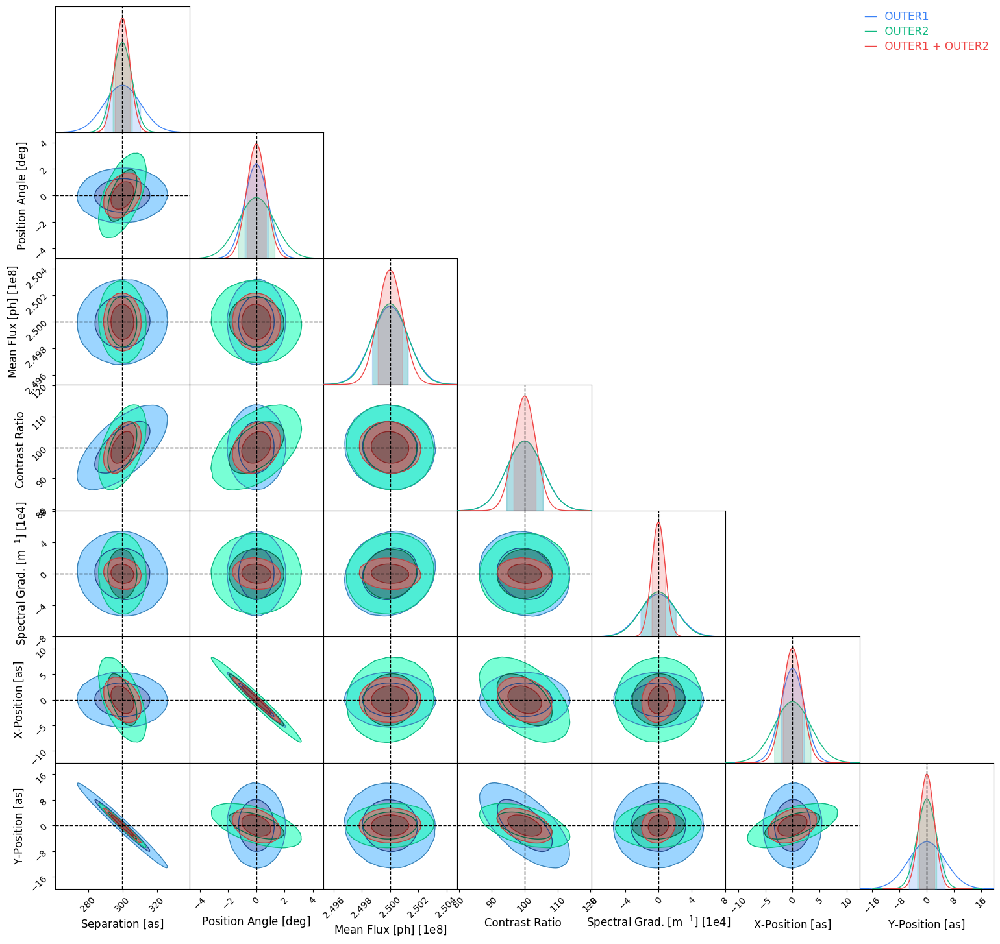

In [540]:
# have to make the last figure; the fisher information at pos1 and pos2
from chainconsumer import ChainConsumer, Chain, Truth
fishers_array = np.load('fishers_array_2.npy')
# normal
idx = 0
plt.style.use('default')
# goated cov matrix
keep_idx = np.array([0,1,2,3,5,6,7])
f1 = fishers_array_2[idx][1][np.ix_(keep_idx, keep_idx)]
f2 = fishers_array_2[idx][0][np.ix_(keep_idx, keep_idx)]
f3 = f1 + f2

param_names = [r'Separation $[\mathrm{as}]$', r'Position Angle $[\mathrm{deg}]$', r'Mean Flux $[\mathrm{ph}]$','Contrast Ratio',r'Spectral Grad. $[\mathrm{m}^{-1}]$', r'X-Position $[\mathrm{as}]$', r'Y-Position $[\mathrm{as}]$']
X = np.array([1000*dlu.rad2arcsec(separation), 0,2.5e8, contrast, spec_grad, 0, 0])

# no posangle
# param_names = ['separation', 'mean_flux', 'contrast_ratio','spec_grad', 'pos_x', 'pos_y']
# X = np.array([separation, flux, contrast, spec_grad, 0, 0])

# no flux
# param_names = ['separation','pos_angle', 'contrast_ratio','spec_grad', 'pos_x', 'pos_y']
# X = np.array([1000*dlu.rad2arcsec(separation), 90, contrast, spec_grad, 0, 0])

c = ChainConsumer()

c.add_chain(
    Chain.from_covariance(mean=X, covariance=np.linalg.inv(f1), columns=param_names, name="OUTER1")
)

c.add_chain(
    Chain.from_covariance(mean=X, covariance=np.linalg.inv(f2), columns=param_names, name="OUTER2")
)

c.add_chain(
    Chain.from_covariance(mean=X, covariance=np.linalg.inv(f3), columns=param_names, name="OUTER1 + OUTER2")
)

c.add_truth(Truth(location={param_names[0]: 1000*dlu.rad2arcsec(separation), param_names[1]: 0, param_names[2]: 2.5e8, 
                            param_names[3]: contrast, param_names[4]: spec_grad, param_names[5]: 0, param_names[6]: 0}))


fig = c.plotter.plot(filename='ccOuter.pdf')

#c.plotter.save('ccouter.pdf',bbox_inches='tight')